# CMS GIWAXS mask & .poni generation notebook

In [ ]:
# Kernel updates if needed, remember to restart the kernel after running this cell!:
!pip install -e /nsls2/users/alevin/repos/PyHyperScattering  # to use pip to install via directory

## Imports

In [2]:
# Imports:
import pathlib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import PyHyperScattering as phs
import pyFAI
from pyFAI.gui import jupyter
from pyFAI.gui.jupyter.calib import Calibration
import pygix

print(f'Using PyHyperScattering Version: {phs.__version__}')
print(f"Using pyFAI version {pyFAI.version}")

# Initialize a giwaxs data loader without any metadata naming scheme
loader = phs.load.CMSGIWAXSLoader()

/nsls2/users/alevin/repos/PyHyperScattering/src/PyHyperScattering/integrate.py:3: UserWarning: Could not import CuPy or ndigpu.  If you expect this machine to support CuPy, check dependencies.  Falling back to scikit-image/numpy CPU integration.
  from PyHyperScattering.WPIntegrator import WPIntegrator


Using PyHyperScattering Version: 0+untagged.500.g80617e6
Using pyFAI version 2023.5.0


## Define paths & show calibration file

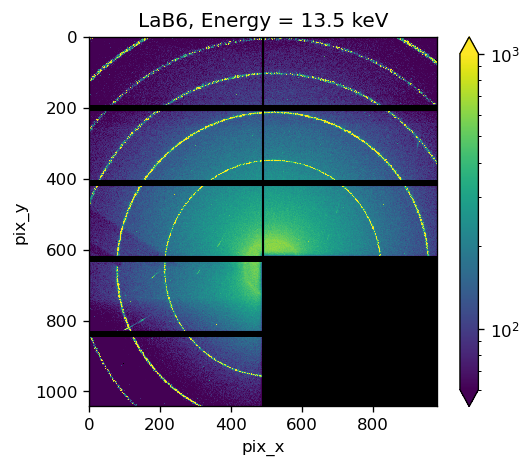

In [4]:
# Define paths
userPath = pathlib.Path('/nsls2/users/alevin')
propPath = pathlib.Path('/nsls2/data/cms/proposals/2023-2/pass-311415')
dataPath = propPath.joinpath('KWhite5')
calibPath = dataPath.joinpath('maxs/raw/LaB6_5.6m_12.7keV_4250.1s_x0.001_th0.120_10.00s_1118442_maxs.tiff')
maskponiPath = userPath.joinpath('giwaxs_suite/beamline_data/maskponi')  # place for pyhyper-drawn masks and poni files

# Load calibration file
LaB6_DA = loader.loadSingleImage(calibPath)  # Loads the file specified at calibPath into an xr.DataArray object
energy = 13.5  # keV

# Plot 
cmap = plt.cm.viridis.copy()  # Set a colormap, here I've chosen viridis
cmap.set_bad('black')  # Set the color for the detector gaps
clim=(6e1, 1e3)  # Specify color limits

ax = LaB6_DA.plot.imshow(norm=LogNorm(clim[0], clim[1]), cmap=cmap, figsize=(5,4), origin='upper')
ax.axes.set(aspect='equal', title=f"LaB6, Energy = {energy} keV")
ax.figure.set(dpi=120)
plt.show()

## Draw mask:

In [8]:
# Draw mask
draw = phs.IntegrationUtils.DrawMask(LaB6_DA, clim=clim)
draw.ui()

Usage: click the "PolyAnnotator" tool at top right.  DOUBLE CLICK to start drawing a masked object, SINGLE CLICK to add a vertex, then DOUBLE CLICK to finish.  Click/drag individual vertex to adjust.


:Layout
   .DynamicMap.I :DynamicMap   []
      :Overlay
         .Image.I    :Image   [pix_y,pix_x]   (value)
         .Polygons.I :Polygons   [x,y]   (Label,Value)
   .Annotator.I  :Overlay
      .Table.PolyAnnotator          :Table   [Label]
      .Table.PolyAnnotator_Vertices :Table   [x,y]   (Value)

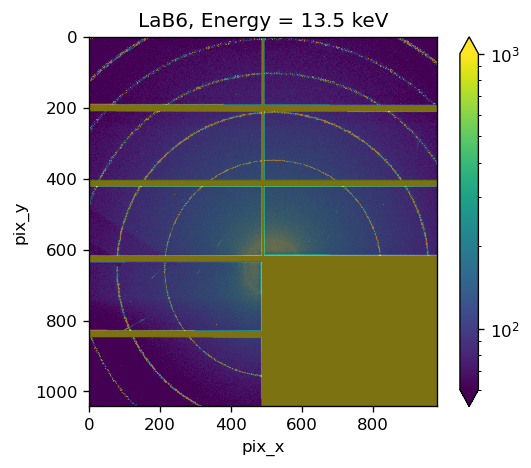

In [27]:
# Save drawn mask above
draw.save(maskponiPath.joinpath('LaB6.json'))
# draw.load(maskponiPath.joinpath('LaB6.json'))
mask = draw.mask  # Loads mask as numpy array

# Plot it over calibrant image to check
ax = LaB6_DA.plot.imshow(norm=LogNorm(clim[0], clim[1]), cmap=cmap, figsize=(5,4), origin='upper')
ax.axes.imshow(mask, alpha=0.5)
ax.axes.set(aspect='equal', title=f"LaB6, Energy = {energy} keV")
ax.figure.set(dpi=120)
plt.show()

## Run pyFAI calibration:

### PyFAI calibration widget

In [45]:
# Set matplotlib backend to 'widget':
%matplotlib widget

In [46]:
# Open & run calibration widget
LaB6_da = loader.loadSingleImage(calibPath)  # This is needed if you did not execute the above cells for masking
wavelength = np.round((4.1357e-15*2.99792458e8)/(energy*1000), 13)  # Important to be correct! Make sure the energy is in keV and correct!
pilatus = pyFAI.detector_factory('Pilatus1M')
LaB6 = pyFAI.calibrant.CALIBRANT_FACTORY("LaB6")
LaB6.wavelength = wavelength

calib = Calibration(LaB6_da.data, calibrant=LaB6, wavelength=wavelength, detector=pilatus)

### Modifying & saving poni

In [47]:
### Check & save .poni
gr = calib.geoRef
print(gr)
print(calib.fixed)
print(gr.chi2())
gr.save(maskponiPath.joinpath('LaB6_unfixed_rot.poni'))

Detector Pilatus 1M	 PixelSize= 1.720e-04, 1.720e-04 m
Wavelength= 9.180000e-11 m
SampleDetDist= 1.399619e-01 m	PONI= -5.150694e-02, -6.225713e-02 m	rot1=-0.942259  rot2=0.717957  rot3=0.000000 rad
DirectBeamDist= 316.066 mm	Center: x=757.530, y=909.398 pix	Tilt= 63.716° tiltPlanRotation= 47.198° 𝛌= 0.918Å
['wavelength', 'rot3']
0.010655652682729356


In [49]:
# Optional fit with rotations fixed to 0
# Likely the best fit for transmission geometry
gr = calib.geoRef
gr.rot1=gr.rot2=gr.rot3=0
# gr.center_array=[318, 1277]
# gr.set_dist = 2.837
gr.refine3(fix=['wavelength', 'rot1', 'rot2', 'rot3'])
print(gr.chi2())
print(gr)
gr.save(maskponiPath.joinpath('LaB6_fixed_rot.poni'))

4.833398565850448e-05
Detector Pilatus 1M	 PixelSize= 1.720e-04, 1.720e-04 m
Wavelength= 9.180000e-11 m
SampleDetDist= 2.332569e-01 m	PONI= 1.124927e-01, 8.928952e-02 m	rot1=0.000000  rot2=0.000000  rot3=0.000000 rad
DirectBeamDist= 233.257 mm	Center: x=519.125, y=654.027 pix	Tilt= 0.000° tiltPlanRotation= 0.000° 𝛌= 0.918Å


### Calibrant check

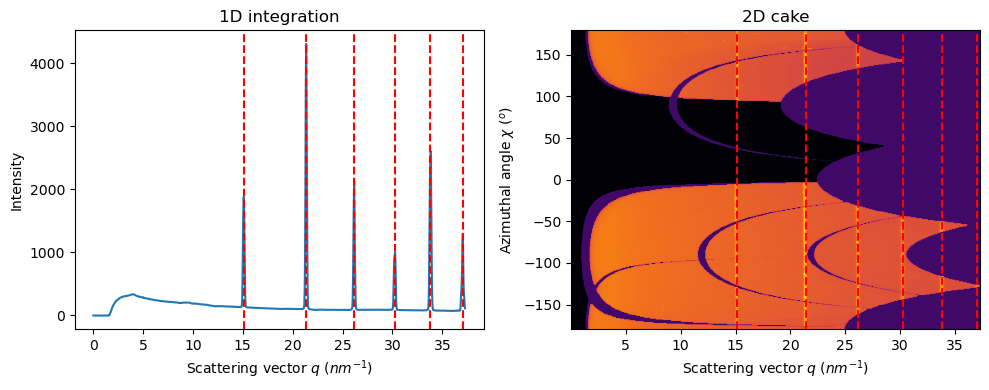

In [56]:
# Turn matplotlib backend back to inline mode & clear open widget plots
%matplotlib inline  
plt.close('all')

# This verifies that the calibration is good (overlays expected calibrant peaks with reduced data)
# azimuthal integrator tool in pyFAI for transmission mode (use pygix for GI geometry)
ai = pyFAI.load(str(maskponiPath.joinpath('LaB6_fixed_rot.poni')))  # Load the .poni calibration file into azimuthal integrator
res1 = ai.integrate1d(LaB6_da.data, 1000)  # Circular integration
res2 = ai.integrate2d(LaB6_da.data, 1000)  # Makes caked 2d image (q vs chi)

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set(size_inches=(10,4))
jupyter.plot1d(res1, ax=ax1, calibrant=LaB6)
jupyter.plot2d(res2, ax=ax2, calibrant=LaB6)
ax2.set_title('2D cake')
plt.tight_layout()
plt.show()